# 1. Import modules and load MERFISH data 

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

# 2. Load MERLin analysis results

In [3]:
merlin_output_folder = r'I:\MERFISH_Analysis\20220409-storm65_test'
# generate post-analysis folders
postanalysis_folder = os.path.join(merlin_output_folder, 'PostAnalysis')
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Create postanalysis_folder: I:\MERFISH_Analysis\20220409-storm65_test\PostAnalysis


In [4]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,103003331499217496578520121354546764172,0,48.335385,-1006.014022,373.277997,-1008.130822,-1003.897222,371.485197,375.070797
1,104131336313339199353497221522444515591,0,538.712832,-1030.314023,472.907999,-1035.562823,-1025.065223,468.469199,477.346799
2,105628124184693751384824371428235897915,0,757.865873,-952.770021,443.369999,-959.530821,-946.009221,436.285198,450.454799
3,107882109509034875865259133224605917800,0,27.844069,-1003.206022,468.101999,-1005.970822,-1000.441222,465.661199,470.542799
4,109459597052921582858469227474112285045,0,250.796425,-1004.502022,456.977999,-1009.534822,-999.469222,452.701199,461.254799
...,...,...,...,...,...,...,...,...,...
2005,85572115022463228529741779283547765623,14,942.394212,-478.682019,-488.443974,-485.118819,-472.245219,-494.934775,-481.953174
2006,89430143634195744191151682553539141857,14,776.525825,-513.944020,-455.449974,-519.678820,-508.209220,-461.886774,-449.013173
2007,91760577615420639736116245954745464874,14,1285.662600,-604.340022,-519.925975,-611.370822,-597.309222,-527.334775,-512.517175
2008,93638255430398979451176156918699773929,14,1685.516555,-489.212019,-439.033973,-497.214819,-481.209219,-447.090773,-430.977173


In [5]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')
#blanks = [f'Blank-{i}' for i in range(1, 11)]
for _c in df.columns:
    if 'Blank-' in _c:
        df = df.drop(columns=_c)
adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

C:\Users\puzheng\AppData\Local\Temp/ipykernel_26952/376704491.py:8: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = anndata.AnnData(df)


In [6]:
df

,1700022I11Rik,1810046K07Rik,5031425F14Rik,5730522E02Rik,Acta2,Adam2,Adamts2,Adamts4,Adra1b,Alk,...,Unc13c,Unc5b,Unc5d,Ust,Vipr2,Vtn,Vwc2,Wipf3,Wnt7b,Zfp804b
index,,,,,,,,,,,,,,,,,,,,,
103003331499217496578520121354546764172,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
104131336313339199353497221522444515591,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
105628124184693751384824371428235897915,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
107882109509034875865259133224605917800,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
109459597052921582858469227474112285045,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85572115022463228529741779283547765623,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0
89430143634195744191151682553539141857,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.0,0.0,1.0
91760577615420639736116245954745464874,1.0,0.0,3.0,0.0,3.0,1.0,2.0,2.0,8.0,0.0,...,1.0,1.0,3.0,0.0,0.0,1.0,0.0,25.0,1.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [7]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

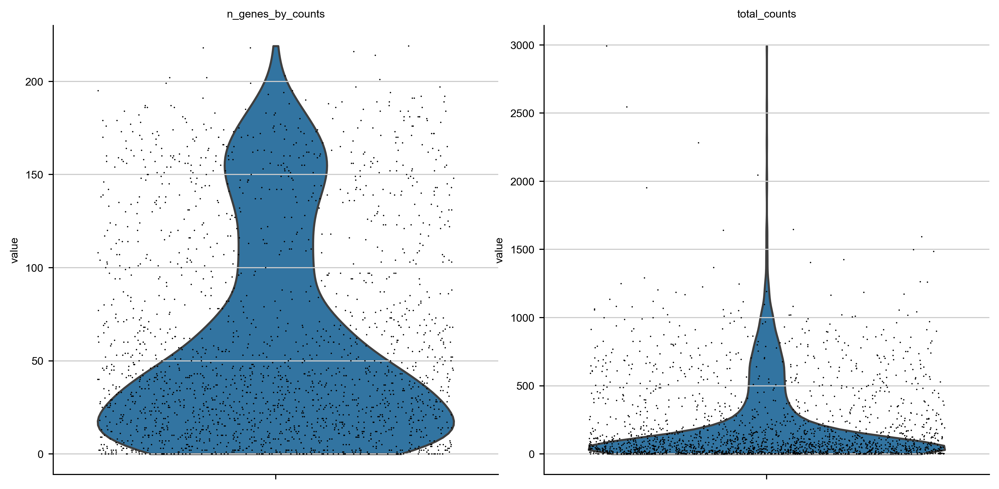

In [8]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

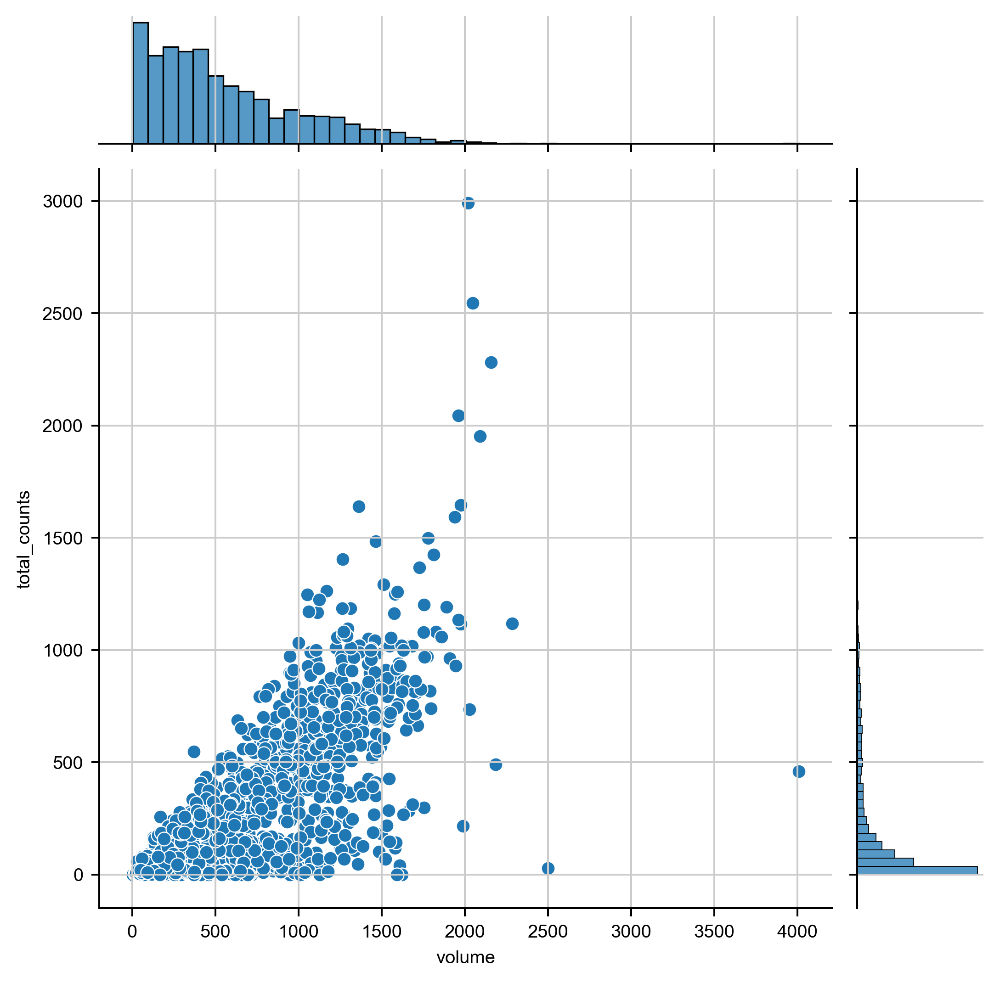

In [9]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts')

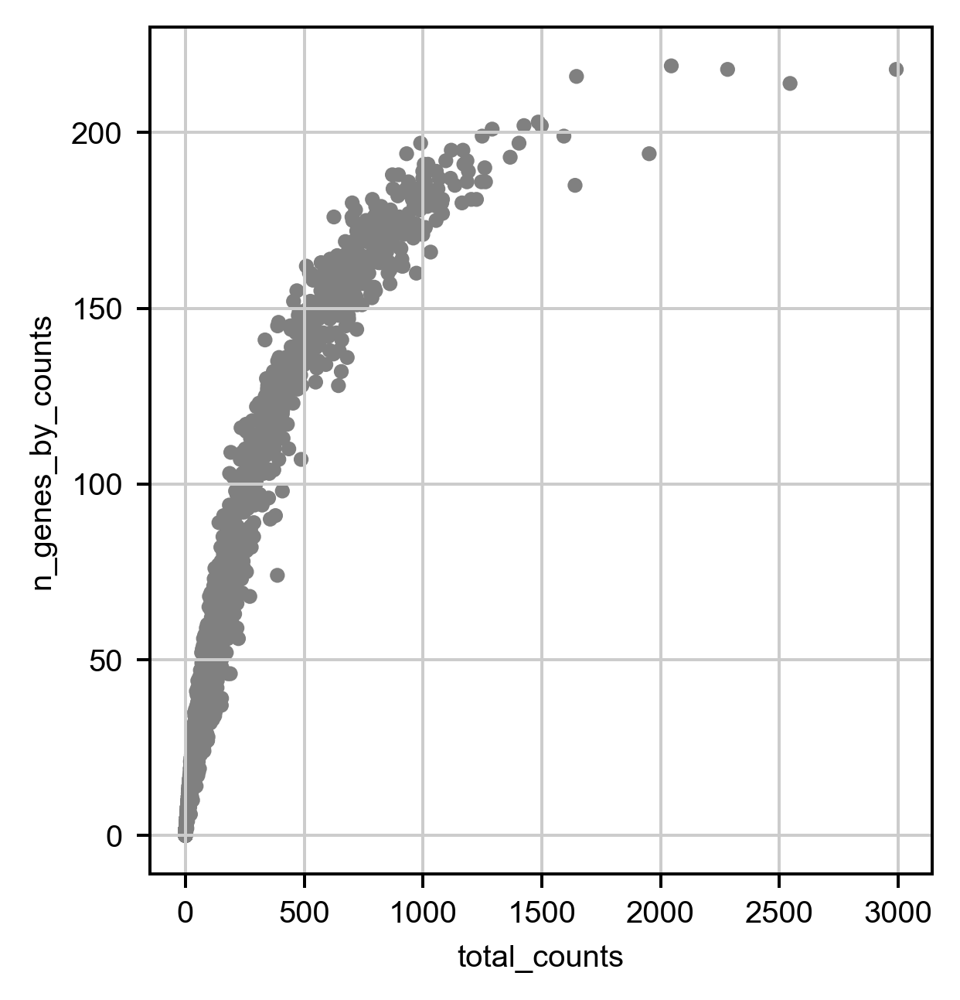

In [10]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [11]:
gene_count_threshold = 10
total_count_threshold = 20
volume_threshold = 100
volume_upper_threshold = 5000
# Filtering
adata = adata[adata.obs['n_genes_by_counts'] > gene_count_threshold]
adata = adata[adata.obs['total_counts'] > total_count_threshold]
adata = adata[adata.obs['volume'] > volume_threshold]
adata = adata[adata.obs['volume'] <= volume_upper_threshold]

print(len(adata) / len(cell_meta_data) , len(adata))

0.746268656716418 1500


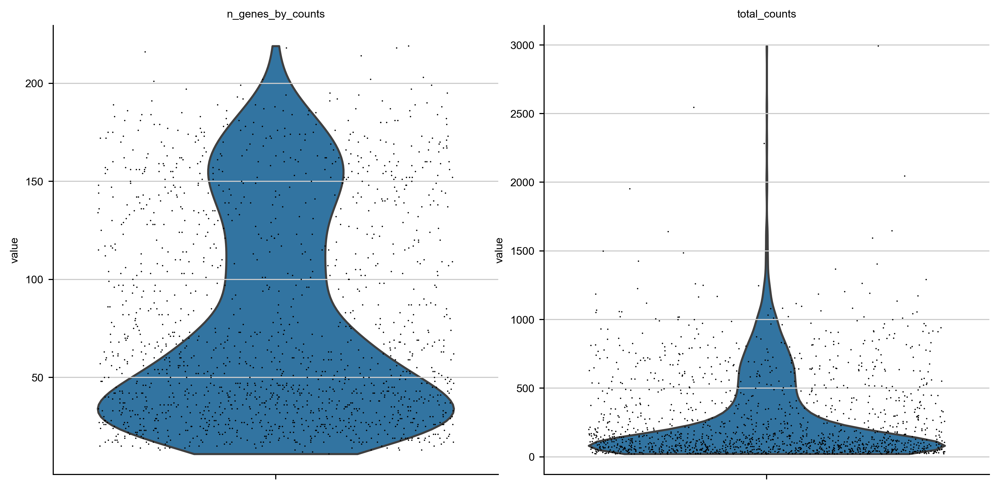

In [12]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [13]:
np.mean(adata.obs['total_counts'])

276.0146789550781

## 4. PCA and UMAP of the MERFISH data (for quick test)

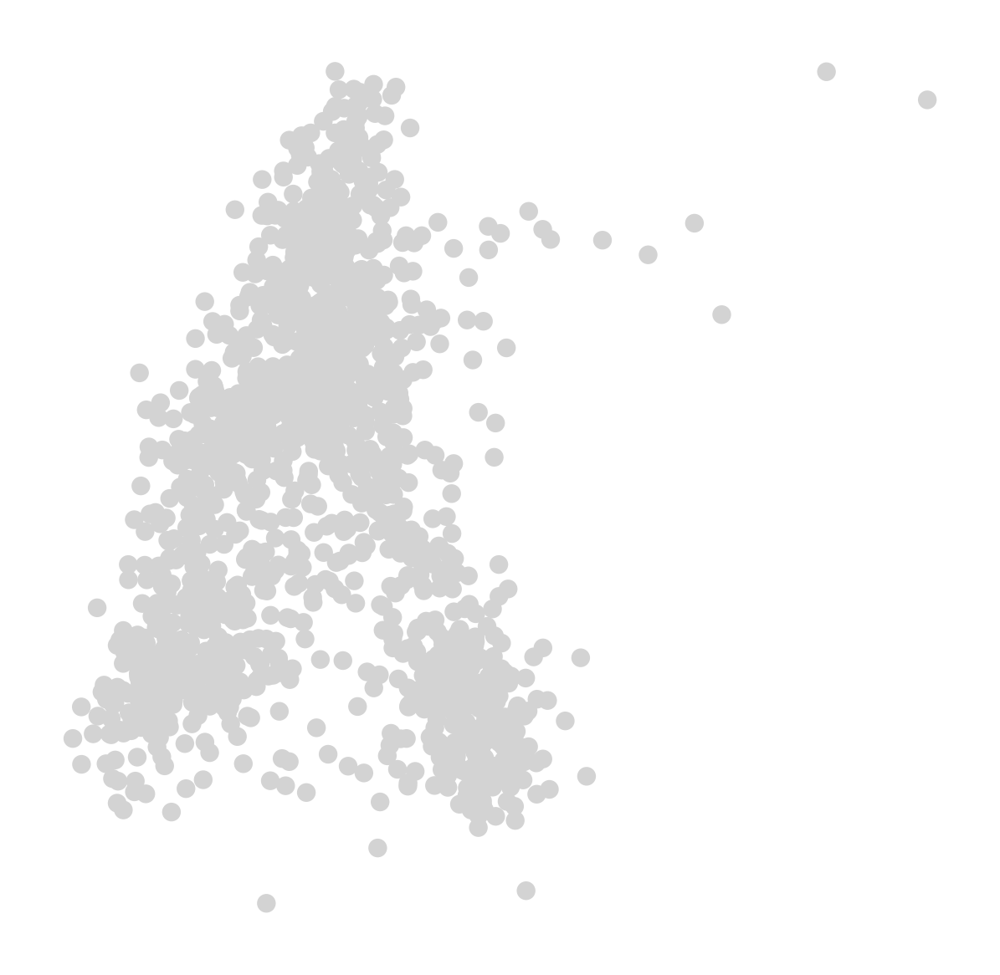

In [16]:
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [ ]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [17]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

Wall time: 4min 33s


In [18]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=1)

Wall time: 2.01 s


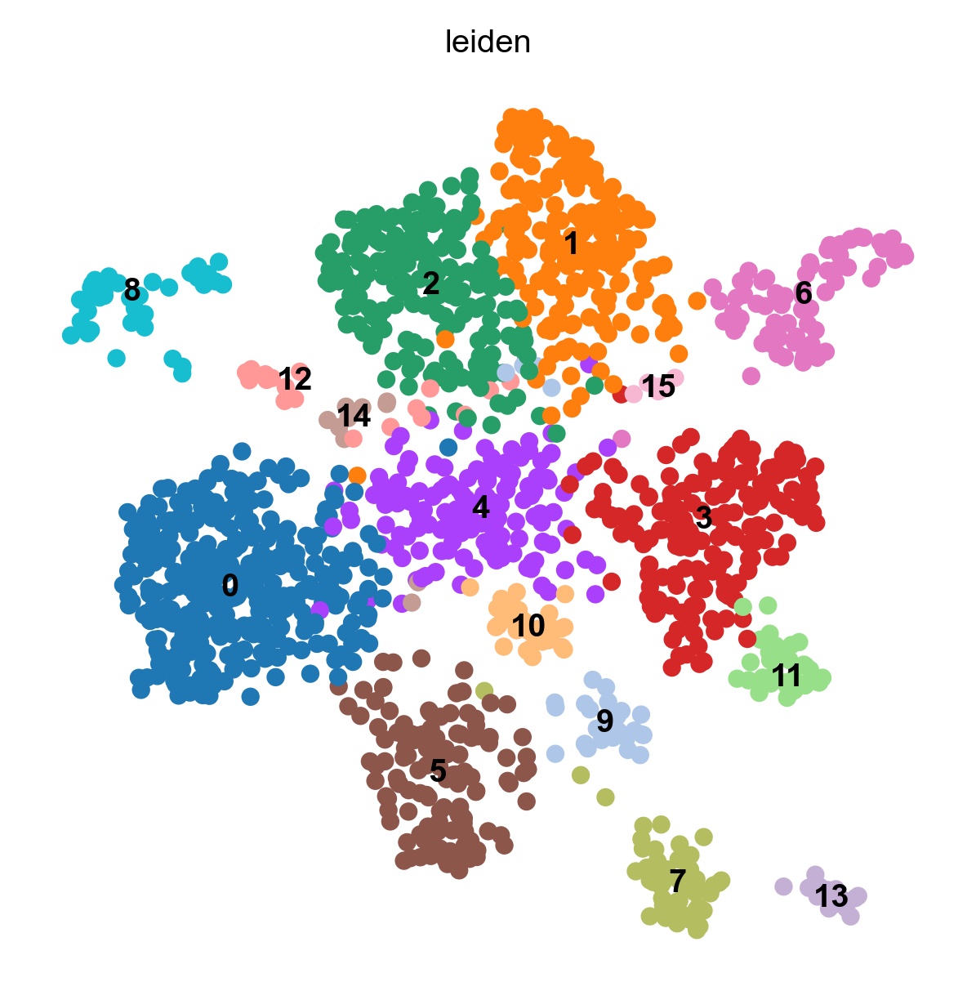

Wall time: 2min 31s
Compiler : 591 ms


In [19]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

(-1116.979454519879, -447.0479885556735, -578.1669041396119, 529.804328204412)

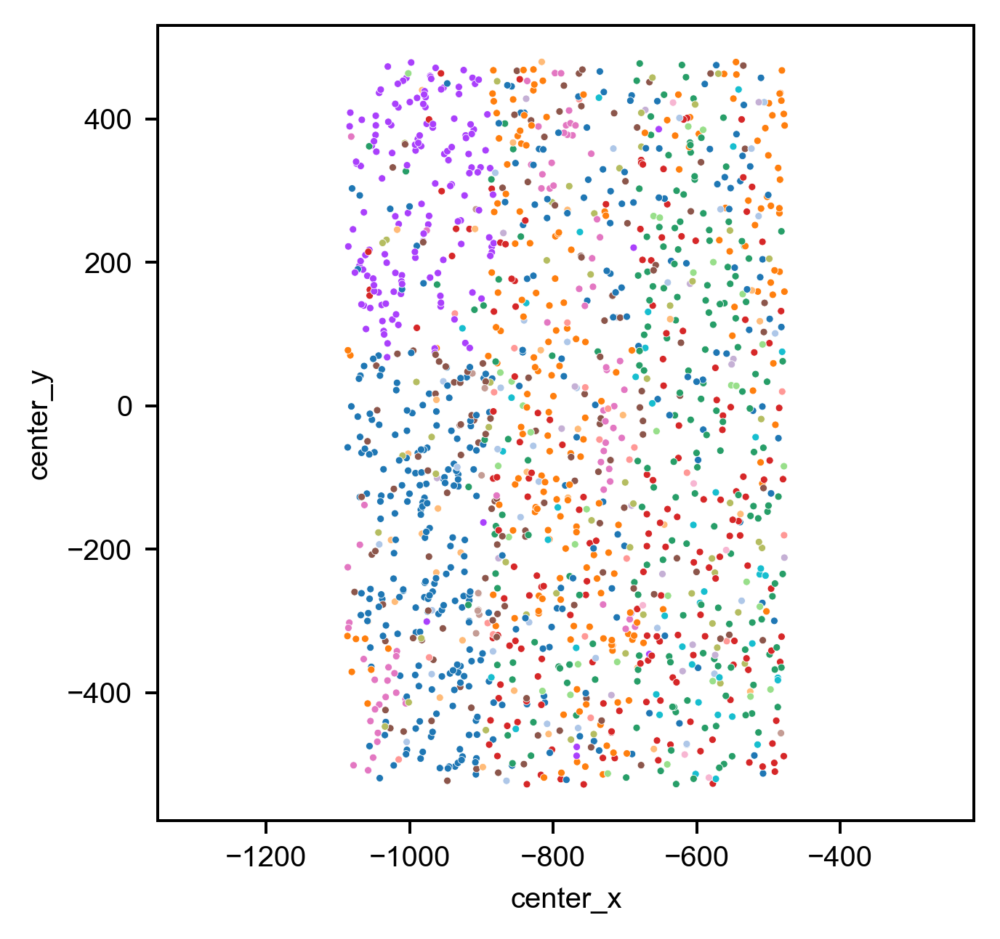

In [22]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
#plt.style.use('dark_background')
ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                hue='leiden', s=4, legend=False)
ax.grid(False)
plt.axis('equal')
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])

## 5. Check count for each cell for genes of interest

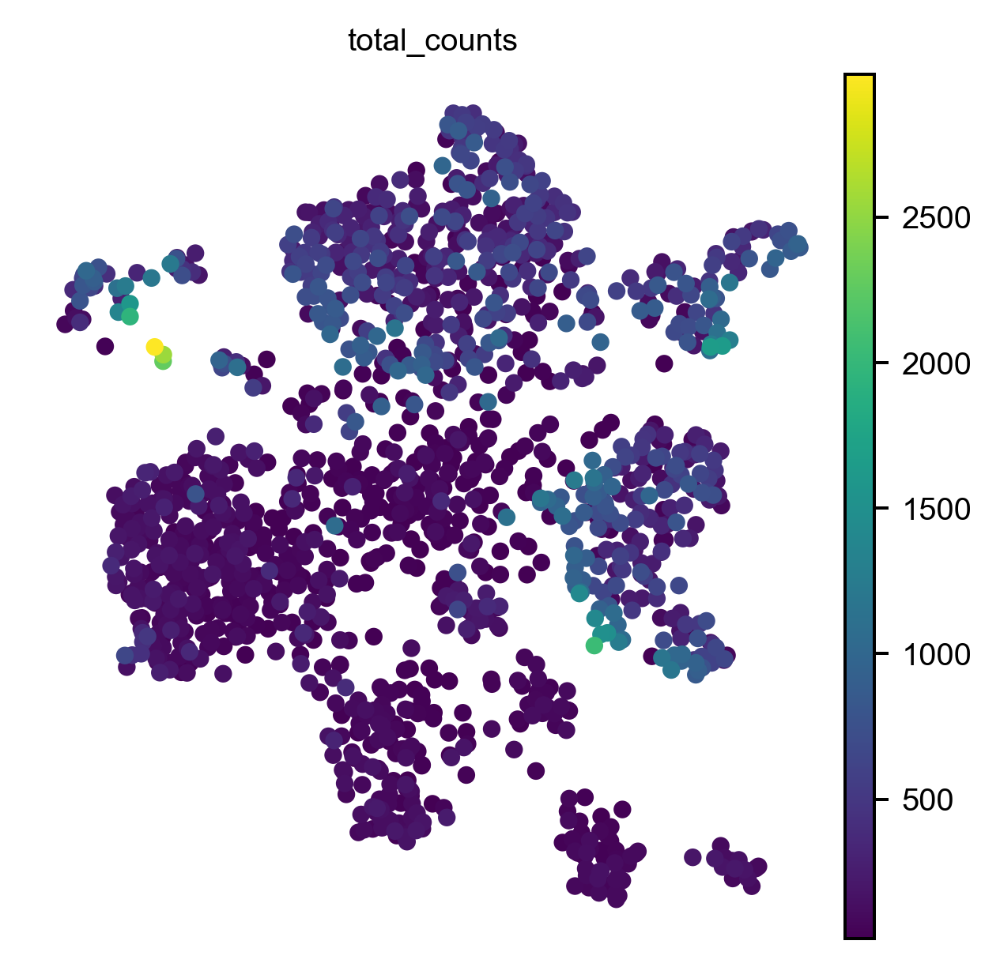

In [25]:
sc.pl.umap(adata, color='total_counts')

In [24]:
# 
marker_genes = ['Slc17a7', 'Slc30a3', 'Slc32a1', 'Cux2', 'Rorb', 'Rspo1','Otof','Sulf2', 'Ptpru', 'Car3', 'Fam84b', 'Syt6', 
               'Nxph4', 'Tshz2', 'Slc32a1', 'Pvalb', 'Sst', 'Vip', 'Sncg', 'Lamp5', 'Sox10', 'Pdgfra', 'Aqp4', 'Igf2',
               'Ctss', 'Cldn5', 'Flt1', 'Bgn', 'Vtn']
marker_genes = [g for g in marker_genes if (g in adata.var.index)]

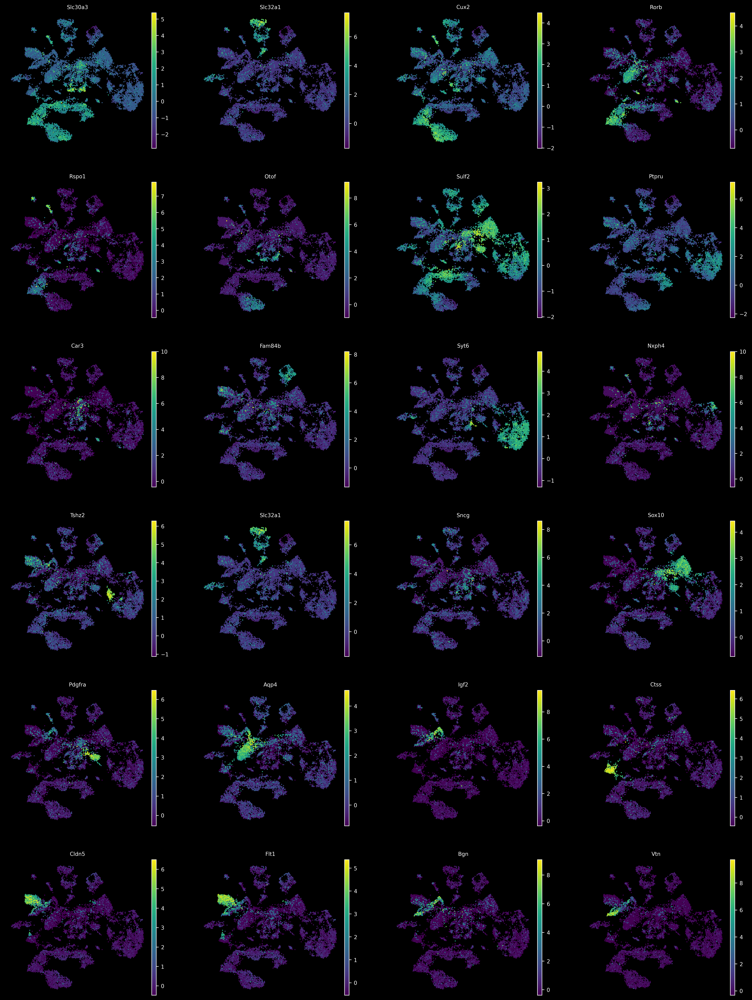

In [20]:
sc.pl.umap(adata, color=marker_genes)

## 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

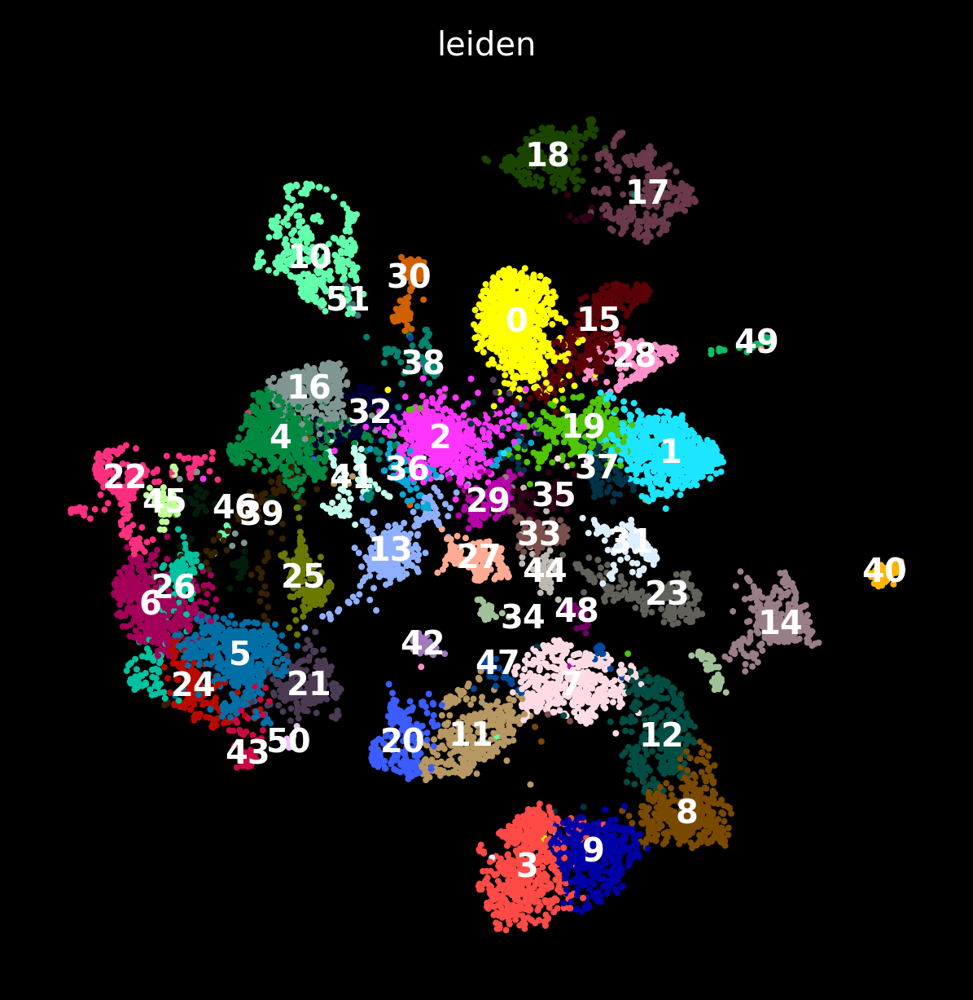

CPU times: user 9.91 s, sys: 44 ms, total: 9.96 s
Wall time: 11.5 s


In [21]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=50)

sc.tl.leiden(adata, resolution=2)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this labels as a new column as 'leiden_cluster'
adata.obs['leiden_cluster'] = adata.obs.leiden

## 6.2 Use lower expected pcs and resolution to UMAP for cell-type distinction at subclass level

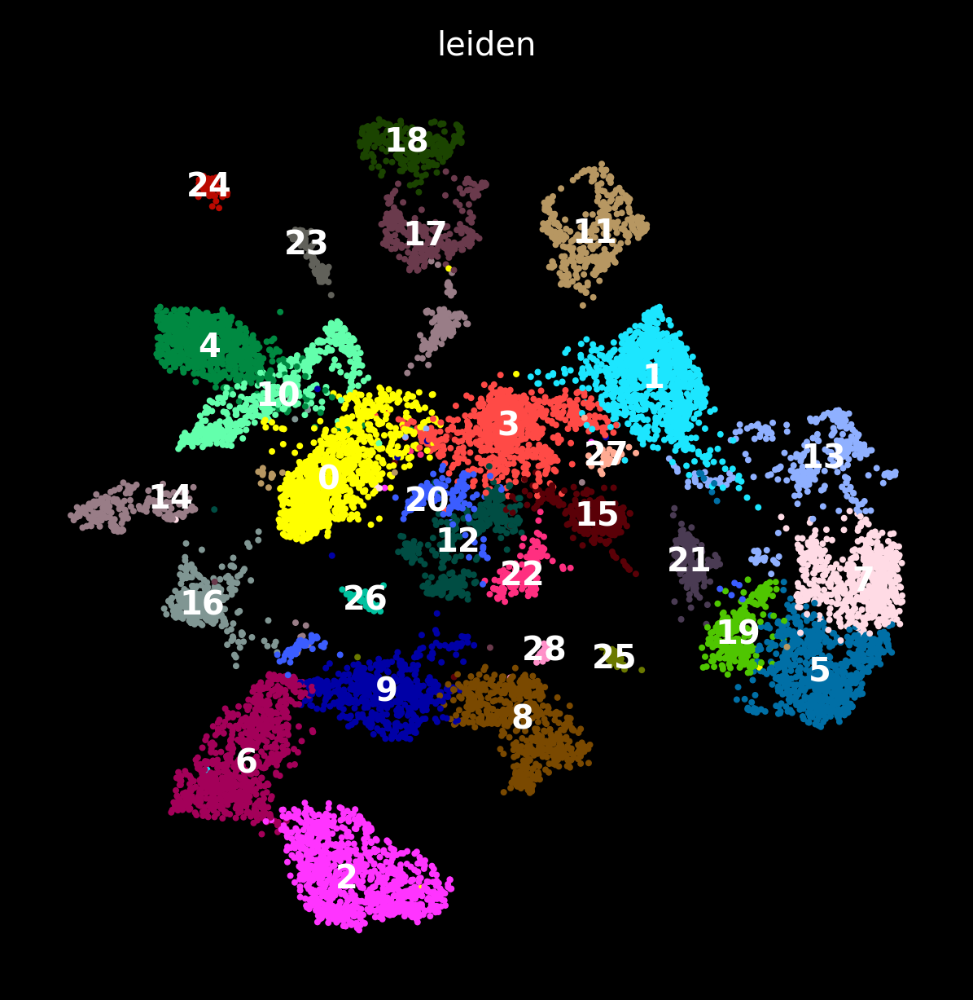

CPU times: user 13.7 s, sys: 41.3 ms, total: 13.8 s
Wall time: 13.8 s


In [22]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

sc.tl.leiden(adata, resolution=1)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this new labels as a new column as 'leiden_subclass'
adata.obs['leiden_subclass'] = adata.obs.leiden

## 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [23]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = True

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: /n/holyscratch01/zhuang_lab/Users/pzheng/Analysis_results/20220329-M1_renamed/PostAnalysis/filtered_cluster_data.h5ad
